## 1.Load the beans dataset.

In [ ]:
#import tensorflow as tf
import tensorflow.compat.v2 as tf
from tensorflow.keras import datasets, layers, models
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from __future__ import absolute_import, division, print_function, unicode_literals
from collections import Counter
# Enable eager execution
tf.enable_v2_behavior()

## 2.Split the data into a training and a test dataset.

loading the dataset:
please install tensorflow_datasets packages using
pip install tensorflow_datasets

In [ ]:
import tensorflow_datasets as tfds

(bn_train, bn_validation, bn_test),bn_info = tfds.load(

    name = 'beans',

    split = ['train', 'validation', 'test'],

    as_supervised = True,

    with_info = True)

print(bn_info)

tfds.core.DatasetInfo(
    name='beans',
    full_name='beans/0.1.0',
    description="""
    Beans is a dataset of images of beans taken in the field using smartphone
    cameras. It consists of 3 classes: 2 disease classes and the healthy class.
    Diseases depicted include Angular Leaf Spot and Bean Rust. Data was annotated by
    experts from the National Crops Resources Research Institute (NaCRRI) in Uganda
    and collected by the Makerere AI research lab.
    """,
    homepage='https://github.com/AI-Lab-Makerere/ibean/',
    data_path='/root/tensorflow_datasets/beans/0.1.0',
    file_format=tfrecord,
    download_size=171.69 MiB,
    dataset_size=171.63 MiB,
    features=FeaturesDict({
        'image': Image(shape=(500, 500, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=3),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=128, num_shards=1>,
        'train': <Spli

In [ ]:
# the training dataset has features/image and label/target
for image, label in bn_train.take(1):  # example is (image, label)
  print(image.shape, label)


(500, 500, 3) tf.Tensor(1, shape=(), dtype=int64)


In [ ]:
print(bn_info.features["label"].num_classes)
print(bn_info.features["label"].names)

3
['angular_leaf_spot', 'bean_rust', 'healthy']


In [ ]:
print(bn_info.features.shape)
print(bn_info.features.tf_dtype)
print(bn_info.features['image'].shape)
print(bn_info.features['image'].tf_dtype)

{'image': (500, 500, 3), 'label': ()}
{'image': tf.uint8, 'label': tf.int64}
(500, 500, 3)
<dtype: 'uint8'>


In [ ]:

# Image parameters:
image_height = 500
image_width = 500
num_channels = 3 # RGB
num_classes = 3 # healthy, angular leaf spot disease, bean rust disease

# Pipeline hyperparameters:
batch_size = 32

# Let's keep the dimensions the same (no resizing for now)
# the inputs are the image, label and target size
def normalize_image(image, label, target_height = 500, target_width = 500):
    """Normalizes images: `unit8` -> `float32` and resizes images
    by keeping the aspect ratio the same without distortion."""
    image = tf.cast(image, tf.float32)/255.
    image = tf.image.resize_with_crop_or_pad(image, target_height, target_width)
    return image, label
#apply normalize_image() function to each of image avoid writing a loop
bn_train = bn_train.map(normalize_image, num_parallel_calls = tf.data.experimental.AUTOTUNE)
bn_train = bn_train.cache().shuffle(1000)
bn_train = bn_train.shuffle(bn_info.splits['train'].num_examples)
bn_train = bn_train.batch(batch_size)
bn_train = bn_train.prefetch(tf.data.experimental.AUTOTUNE)


Perform the similar tasks for the validation dataset

In [ ]:
bn_validation = bn_validation.map(
    normalize_image, num_parallel_calls = tf.data.experimental.AUTOTUNE)
bn_validation = bn_validation.batch(batch_size)
bn_validation = bn_validation.cache()
bn_validation = bn_validation.prefetch(tf.data.experimental.AUTOTUNE)

bn_test = bn_test.map(
    normalize_image, num_parallel_calls = tf.data.experimental.AUTOTUNE)
bn_test = bn_test.batch(batch_size)
bn_test = bn_test.cache()
bn_test = bn_test.prefetch(tf.data.experimental.AUTOTUNE)

In [ ]:
def return_class_labels(ds):
    """"Returns a list of class labels from a `DatasetV1Adapter` object."""
    l_labels = []
    # since we handle labels only in this funciton, we discard the first parameter that is image
    # we take out one batch that is 32 images and lables
    for _, labels in ds.take(-1):
        labels = labels.numpy()
        l_labels.append(labels[:])
    # the l_labels is a nest of list , for example [ [1, 0, 2, ...], [2,1, 1,..], ..]
    # return a single list by using list comprehension
    #[1, 0, 2, ..., 2, 1, 1, ..]
    return [item for sublist in l_labels for item in sublist]

training_labels = return_class_labels(bn_train)
print("The distribution of training labels is: ", (Counter(training_labels)))

validation_labels = return_class_labels(bn_validation)
print("The distribution of validation labels is: ", (Counter(validation_labels)))

test_labels = return_class_labels(bn_test)
print("The distribution of test labels is: ", (Counter(test_labels)))

The distribution of training labels is:  Counter({1: 348, 0: 345, 2: 341})
The distribution of validation labels is:  Counter({1: 45, 2: 44, 0: 44})
The distribution of test labels is:  Counter({0: 43, 1: 43, 2: 42})


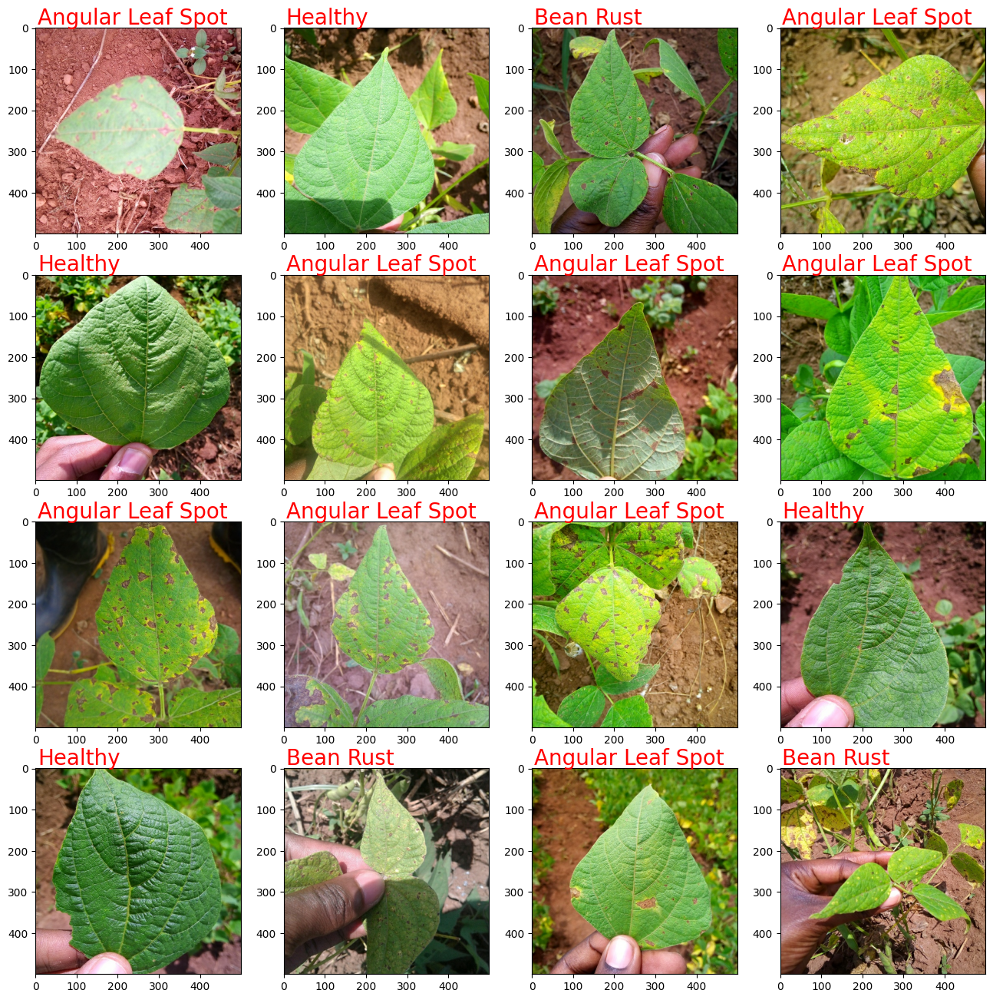

In [ ]:
# take out one batch that is 32 images
example = bn_train.take(1)
# each batch has two componets, image and label
# sample=(image, lable)
for sample in example:
    image, label = sample[0], sample[1]
    #convert them to np
    image = image.numpy()
    label = label.numpy()

n_cols, n_rows = 4, 4
plt.rcParams['figure.figsize'] = [n_cols*4, n_rows*4]
fig = plt.figure()
for i in range(1, n_cols*n_rows + 1):
    ax = fig.add_subplot(n_rows, n_cols,i)
    # we label the subplots using names instead of magic numbers such as 0, 1 and 2
    ax.text(5, -9, "Angular Leaf Spot" if label[i] == 0 else "Bean Rust" if label[i] == 1 else "Healthy",
            color = 'red', fontsize = 20)
    ax.imshow(image[i, :, :, :], cmap = plt.get_cmap("jet"))


## 3.Build a CNN network to perform image classification using TensorFlow. Does it overfit or underfit the data? Please justify your answer.

In [ ]:
model = models.Sequential()
input_shape = bn_info.features['image'].shape
model.add(layers.Conv2D(32,(3,3),activation = 'relu',input_shape = input_shape))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(64,(3,3),activation = 'relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(64,(3,3),activation = 'relu'))
model.add(layers.Conv2D(64,(2,2),activation = 'relu'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 498, 498, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 249, 249, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 247, 247, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 123, 123, 64)     0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 121, 121, 64)      36928     
                                                                 
 conv2d_3 (Conv2D)           (None, 120, 120, 64)      1

In [ ]:
# Convert  feature matrix from 4D to 2D
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
# Add dropout layer
model.add(layers.Dropout(0.2))
# Last layer must have 3 neuron to match the label
model.add(layers.Dense(3))
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 498, 498, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 249, 249, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 247, 247, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 123, 123, 64)     0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 121, 121, 64)      36928     
                                                                 
 conv2d_3 (Conv2D)           (None, 120, 120, 64)      1

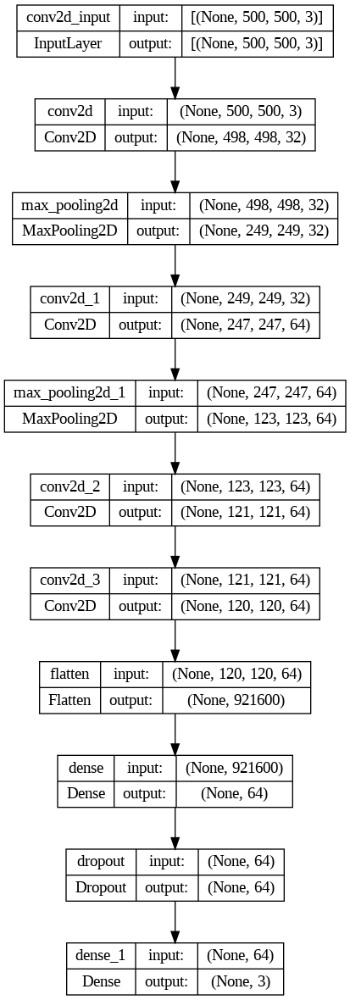

In [ ]:
dot_img_file = 'CNNmodel.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
%%time
callback = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience= 3)
history = model.fit(bn_train, epochs=20,
                    validation_data=bn_test, callbacks=[callback], verbose = 1)

Epoch 1/20
33/33 [==============================] - 699s 21s/step - loss: 1.5643 - accuracy: 0.4478 - val_loss: 0.7792 - val_accuracy: 0.6562
Epoch 2/20
33/33 [==============================] - 678s 21s/step - loss: 0.8079 - accuracy: 0.6238 - val_loss: 0.7105 - val_accuracy: 0.6719
Epoch 3/20
33/33 [==============================] - 698s 21s/step - loss: 0.7262 - accuracy: 0.6809 - val_loss: 0.6030 - val_accuracy: 0.7656
Epoch 4/20
33/33 [==============================] - 692s 21s/step - loss: 0.6320 - accuracy: 0.7398 - val_loss: 0.6611 - val_accuracy: 0.6875
Epoch 5/20
33/33 [==============================] - 670s 20s/step - loss: 0.6159 - accuracy: 0.7563 - val_loss: 0.5714 - val_accuracy: 0.7422
Epoch 6/20
33/33 [==============================] - 694s 21s/step - loss: 0.4916 - accuracy: 0.8066 - val_loss: 0.5161 - val_accuracy: 0.7656
CPU times: user 1h 38min 25s, sys: 14min 44s, total: 1h 53min 9s
Wall time: 1h 10min 26s


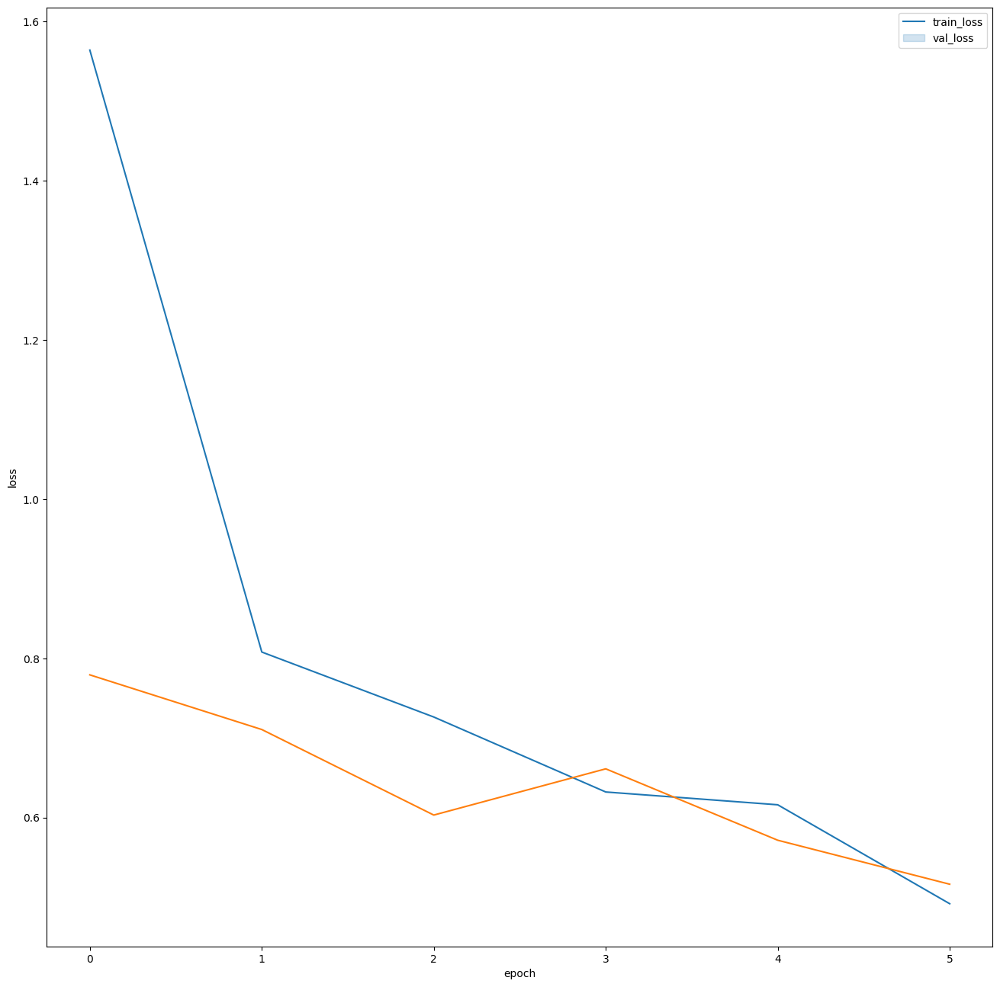

In [ ]:
## Evaluate the Model
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

train_history = pd.DataFrame(history.history)
train_history['epoch'] = history.epoch
# Plot train loss
sns.lineplot(x='epoch', y ='loss', data =train_history)
# Plot validation loss
sns.lineplot(x='epoch', y ='val_loss', data =train_history)
# Add legends
plt.legend(labels=['train_loss', 'val_loss'])


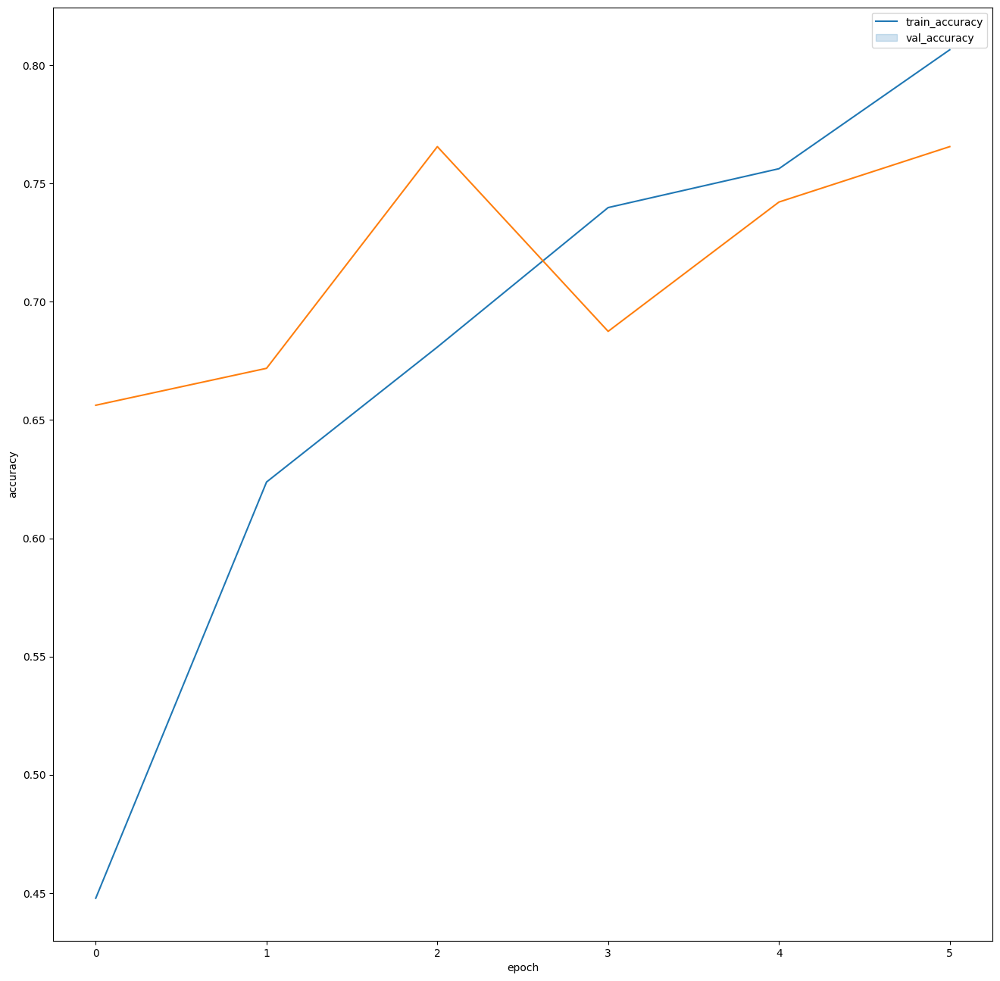

In [ ]:
sns.lineplot(x='epoch', y ='accuracy', data =train_history)
# Plot validation loss
sns.lineplot(x='epoch', y ='val_accuracy', data =train_history)
# Add legends
plt.legend(labels=['train_accuracy', 'val_accuracy'])

In [ ]:
test_loss, test_acc = model.evaluate(bn_test, verbose=0)
print(f' The test loss ={test_loss:.2f} and test accuracy = {test_acc:.2f}')

 The test loss =0.52 and test accuracy = 0.77


## 4.Please use data augmentation techniques to build a CNN network using TensorFlow with same network architecture. Does it produce better performance on the test dataset?

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE # Tune the value dynamically at runtime.

train_data = bn_train.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_data = bn_validation.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
normalization_layer = tf.keras.layers.experimental.preprocessing.Rescaling(1.0/255.0)

In [ ]:
data_aug = tf.keras.Sequential(
  [
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical",
                                                 input_shape=(image_height,
                                                              image_width,
                                                              num_channels)),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.1),
    tf.keras.layers.experimental.preprocessing.RandomTranslation(height_factor=0.1,width_factor = 0.1 ),
    tf.keras.layers.experimental.preprocessing.RandomZoom(height_factor=(0.1, 0.1))
  ]
)

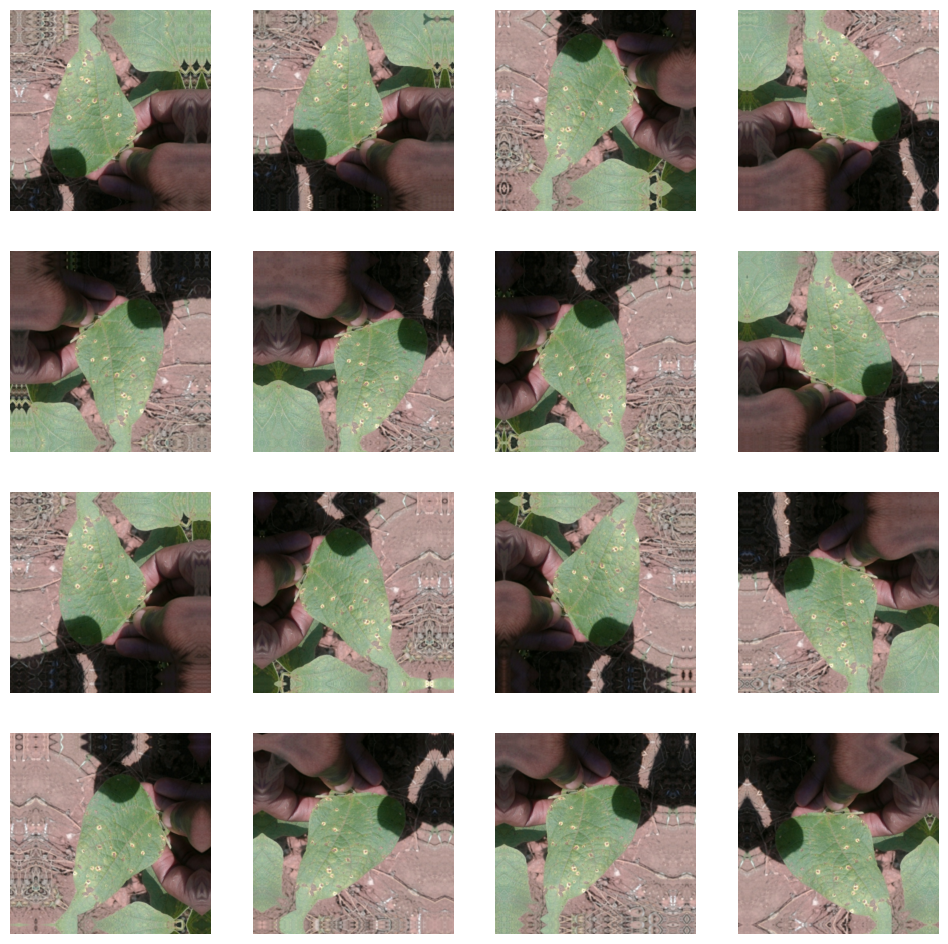

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 12))
for img, lab in bn_train.take(1):

  for i in range(16):
    aug_images = data_aug(img)
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(aug_images[0].numpy().astype("float32"))
    plt.axis("off")

In [ ]:
model = tf.keras.Sequential([
  # Data augmentation
  data_aug,
  # Data normalization
  tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
  tf.keras.layers.Conv2D(16, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(16, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(num_classes)
])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 500, 500, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 500, 500, 3)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 500, 500, 16)      448       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 250, 250, 16)     0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 250, 250, 32)      4640      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 125, 125, 32)     0         
 2D)                                                  

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 500, 500, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 500, 500, 3)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 500, 500, 16)      448       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 250, 250, 16)     0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 250, 250, 32)      4640      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 125, 125, 32)     0         
 2D)                                                  

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
%%time
callback = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience= 3)
epochs= 20
history = model.fit(
  bn_train,
  validation_data=bn_validation,
  epochs=epochs,
  callbacks=[callback], verbose = 1
)

Epoch 1/20
33/33 [==============================] - 439s 13s/step - loss: 1.0996 - accuracy: 0.3337 - val_loss: 1.0986 - val_accuracy: 0.3308
Epoch 2/20
33/33 [==============================] - 419s 13s/step - loss: 1.0987 - accuracy: 0.3298 - val_loss: 1.0986 - val_accuracy: 0.3308
Epoch 3/20
33/33 [==============================] - 434s 13s/step - loss: 1.0988 - accuracy: 0.2998 - val_loss: 1.0986 - val_accuracy: 0.3308
Epoch 4/20
33/33 [==============================] - 428s 13s/step - loss: 1.0986 - accuracy: 0.3337 - val_loss: 1.0986 - val_accuracy: 0.3308
CPU times: user 40min 15s, sys: 5min 28s, total: 45min 44s
Wall time: 28min 41s


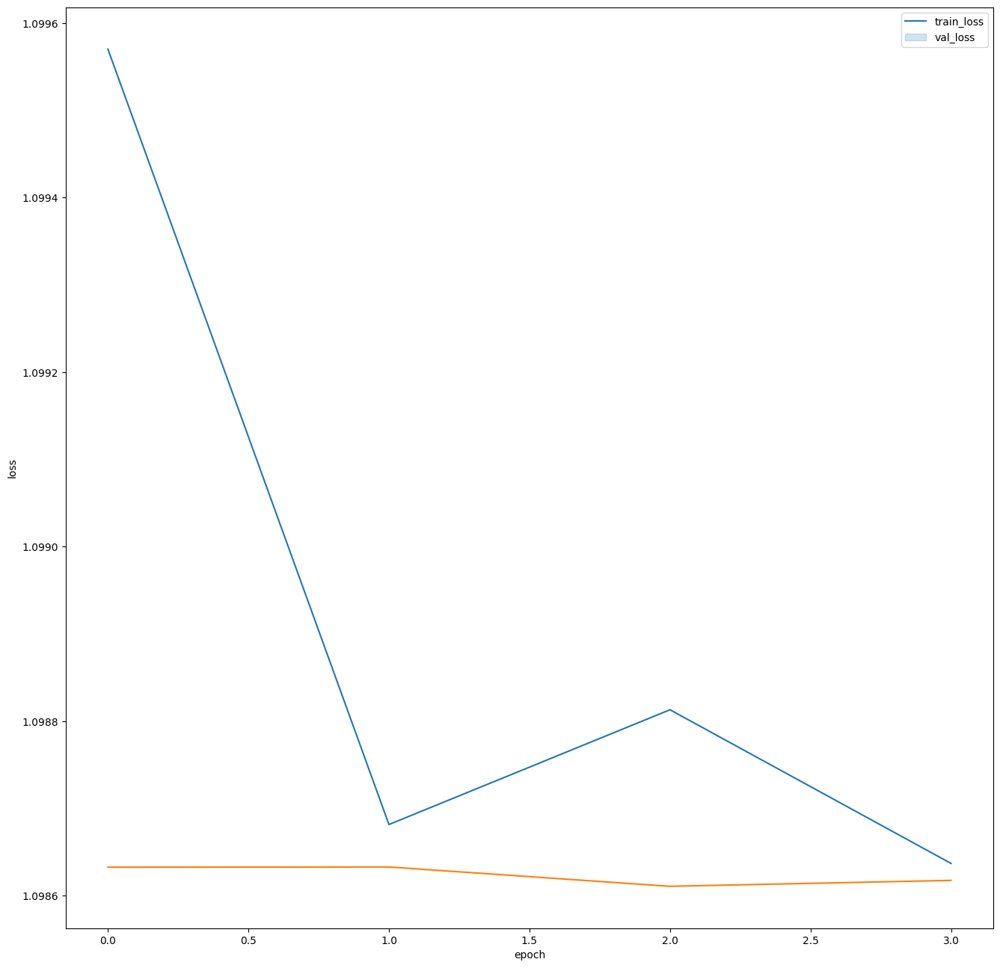

In [ ]:
train_history = pd.DataFrame(history.history)
train_history['epoch'] = history.epoch
#Plot train loss
sns.lineplot(x='epoch', y ='loss', data =train_history)
#Plot validation loss
sns.lineplot(x='epoch', y ='val_loss', data =train_history)
#Add legends
plt.legend(labels=['train_loss', 'val_loss'])

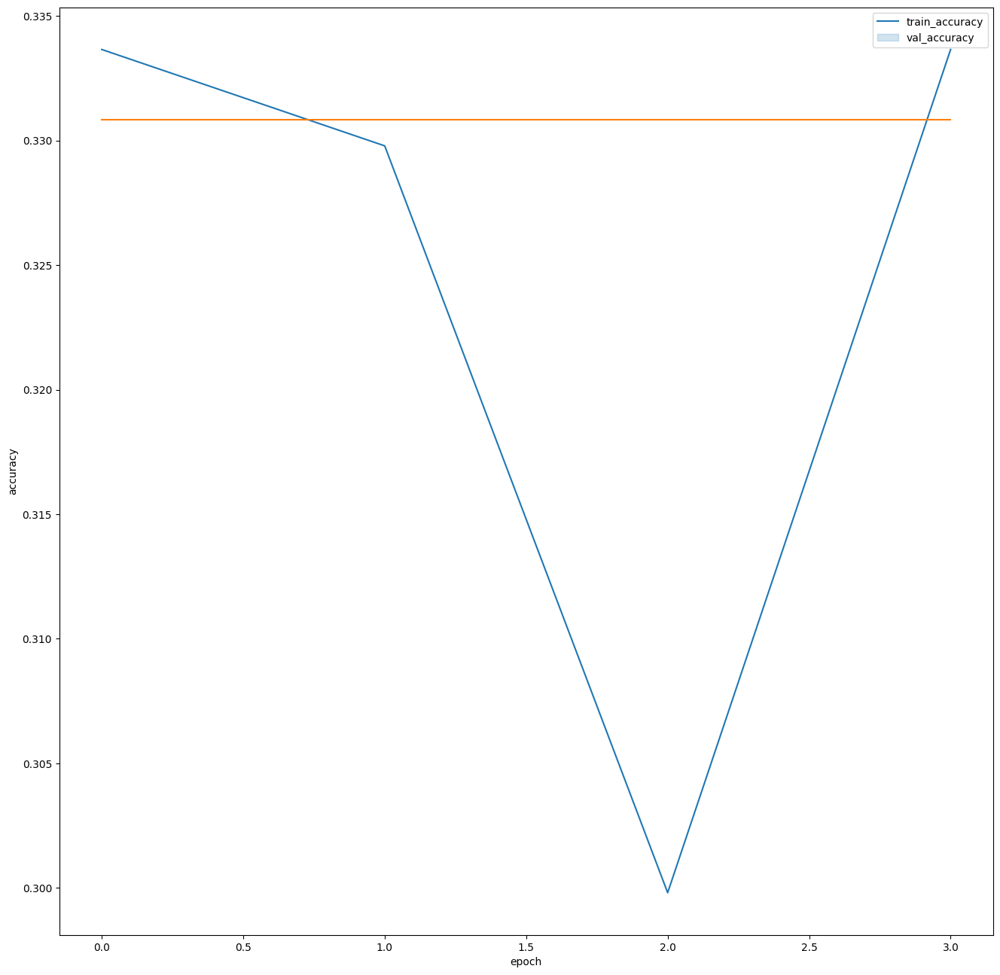

In [ ]:
sns.lineplot(x='epoch', y ='accuracy', data =train_history)
#Plot validation loss
sns.lineplot(x='epoch', y ='val_accuracy', data =train_history)
#Add legends
plt.legend(labels=['train_accuracy', 'val_accuracy'])

## 5.Build a CNN network using transfer learning and TensorFlow by choosing a pre-trained model. Does it produce better performance on the test datasets?

In [ ]:
IMG_SHAPE = (image_height,image_width, num_channels)
MobileNetV3Large_model = tf.keras.applications.MobileNetV3Large(input_shape = IMG_SHAPE,
                                               include_top=False, # Remove the fully-connected layer
                                               weights='imagenet') # Pre-training on ImageNet

12683000/12683000 [==============================] - 0s 0us/step


In [ ]:
MobileNetV3Large_model.summary()

Model: "MobilenetV3large"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 500, 500, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2 (Rescaling)        (None, 500, 500, 3)  0           ['input_1[0][0]']                
                                                                                                  
 Conv (Conv2D)                  (None, 250, 250, 16  432         ['rescaling_2[0][0]']            
                                )                                                                 
                                                                                   

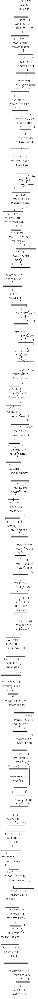

In [ ]:
tf.keras.utils.plot_model(MobileNetV3Large_model, show_shapes=True)

In [ ]:
MobileNetV3Large_model.trainable = False

In [ ]:
preprocess_input = tf.keras.applications.mobilenet_v3.preprocess_input

In [ ]:
image_batch, label_batch = next(iter(bn_train))
feature_batch = MobileNetV3Large_model(image_batch)
print(feature_batch.shape)

(32, 16, 16, 960)


In [ ]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 960)


In [ ]:
global_average_layer = tf.keras.layers.Flatten()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 245760)


In [ ]:
prediction_layer = tf.keras.layers.Dense(5)
prediction_batch = prediction_layer(feature_batch_average)
print(f' The size of the predicted value for a given batch = {prediction_batch.shape}')

 The size of the predicted value for a given batch = (32, 5)


In [ ]:
inputs = tf.keras.Input(shape = IMG_SHAPE)
x = data_aug(inputs)
x = preprocess_input(x)
x = MobileNetV3Large_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [ ]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 500, 500, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, 500, 500, 3)       0         
                                                                 
 MobilenetV3large (Functiona  (None, 16, 16, 960)      2996352   
 l)                                                              
                                                                 
 flatten_2 (Flatten)         (None, 245760)            0         
                                                                 
 dropout_3 (Dropout)         (None, 245760)            0         
                                                                 
 dense_4 (Dense)             (None, 5)                 1228805   
                                                             

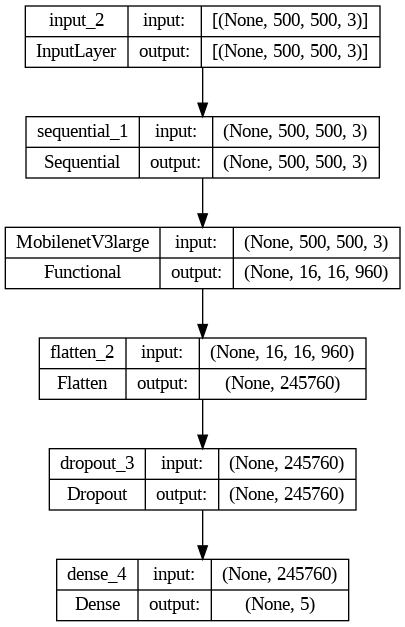

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True)


In [ ]:
%%time
callback = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience= 3)
epochs= 20
history = model.fit(
  train_data,
  validation_data=val_data,
  epochs=epochs,
  callbacks=[callback], verbose = 1
)

Epoch 1/20
33/33 [==============================] - 347s 10s/step - loss: 1.9466 - accuracy: 0.3172 - val_loss: 1.5683 - val_accuracy: 0.3383
Epoch 2/20
33/33 [==============================] - 336s 10s/step - loss: 1.5790 - accuracy: 0.3095 - val_loss: 1.1411 - val_accuracy: 0.3835
Epoch 3/20
33/33 [==============================] - 336s 10s/step - loss: 1.4332 - accuracy: 0.3694 - val_loss: 1.1253 - val_accuracy: 0.4060
Epoch 4/20
33/33 [==============================] - 354s 11s/step - loss: 1.4603 - accuracy: 0.3569 - val_loss: 1.0535 - val_accuracy: 0.4887
Epoch 5/20
33/33 [==============================] - 347s 11s/step - loss: 1.3605 - accuracy: 0.3733 - val_loss: 1.3351 - val_accuracy: 0.4060
Epoch 6/20
33/33 [==============================] - 341s 10s/step - loss: 1.3650 - accuracy: 0.3994 - val_loss: 1.2080 - val_accuracy: 0.3684
Epoch 7/20
33/33 [==============================] - 342s 10s/step - loss: 1.3838 - accuracy: 0.3810 - val_loss: 1.0762 - val_accuracy: 0.4060
CPU ti

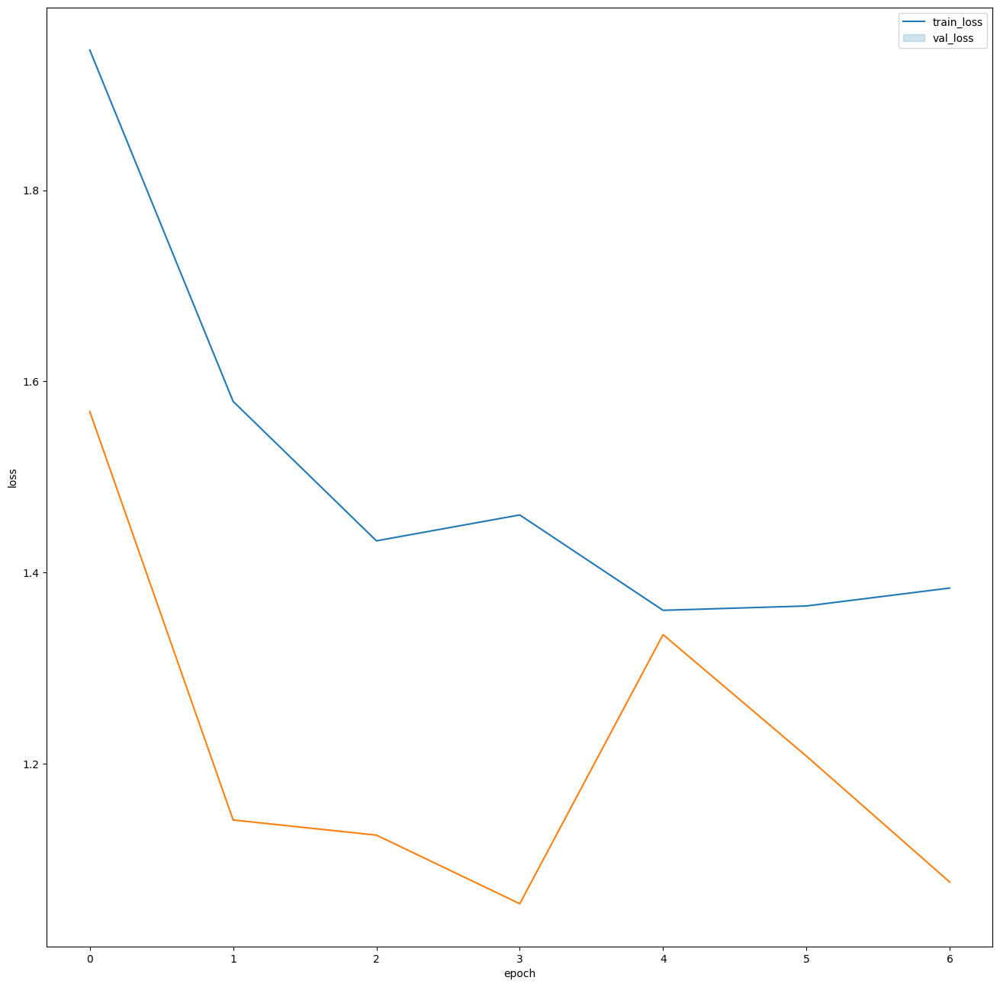

In [ ]:
train_history = pd.DataFrame(history.history)
train_history['epoch'] = history.epoch
#Plot train loss
sns.lineplot(x='epoch', y ='loss', data =train_history)
#Plot validation loss
sns.lineplot(x='epoch', y ='val_loss', data =train_history)
#Add legends
plt.legend(labels=['train_loss', 'val_loss'])

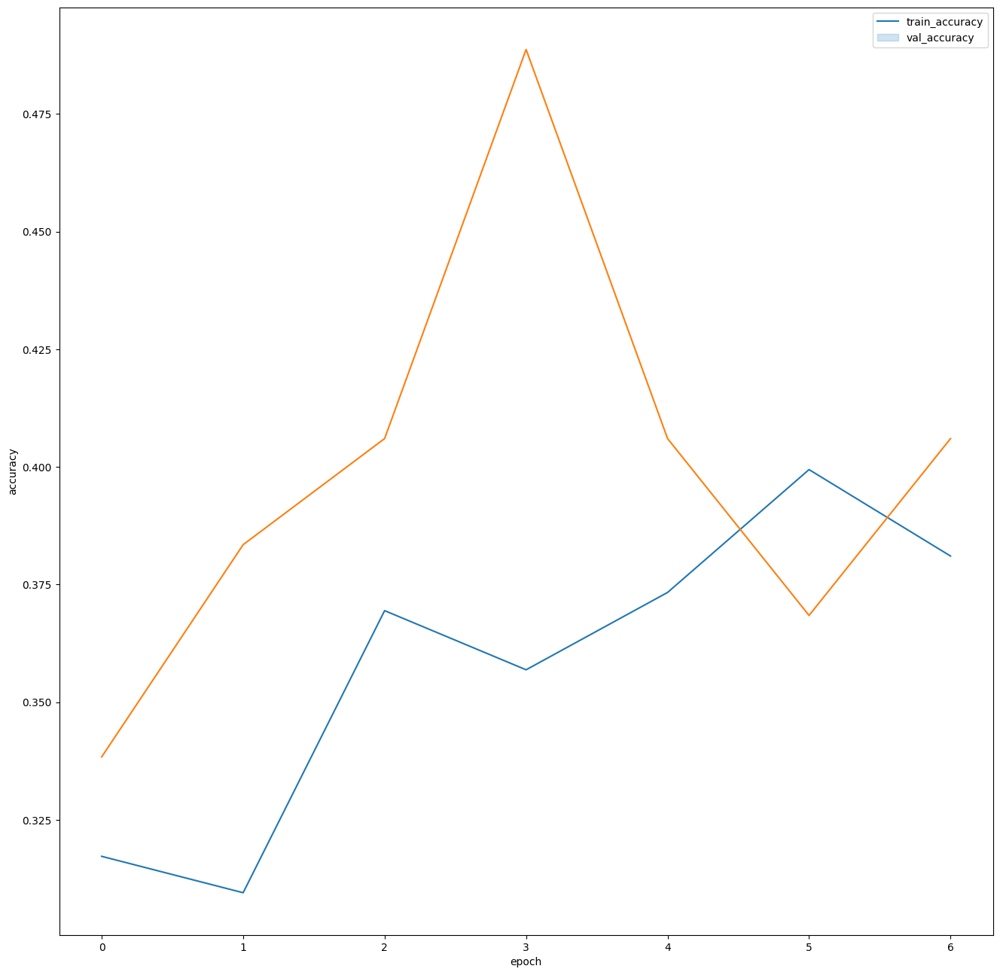

In [ ]:
sns.lineplot(x='epoch', y ='accuracy', data =train_history)
#Plot validation loss
sns.lineplot(x='epoch', y ='val_accuracy', data =train_history)
#Add legends
plt.legend(labels=['train_accuracy', 'val_accuracy'])